<a href="https://colab.research.google.com/github/TiffanyIzzuddin/eye-training-/blob/main/without_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/TiffanyIzzuddin/eye-disease-dataset.git

!ls eye-disease-dataset/dataset

Cloning into 'eye-disease-dataset'...
remote: Enumerating objects: 4245, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 4245 (delta 5), reused 0 (delta 0), pack-reused 4227 (from 2)
Receiving objects: 100% (4245/4245), 734.92 MiB | 69.09 MiB/s, done.
Resolving deltas: 100% (5/5), done.
Updating files: 100% (4219/4219), done.
cataract  diabetic_retinopathy	glaucoma  normal


In [ ]:
# prompt: write the image dataset into dataframe called df that we could use the entire time in this project, and do mapping normal:0, glaucoma:1, cataract:2, diabetic_retinopathy:3

import pandas as pd
import os

# Create an empty list to store the data
data = []

# Define the mapping
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Iterate through the folders and images
for label in mapping:
  folder_path = os.path.join('eye-disease-dataset/dataset', label)
  for filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, filename)
    data.append([image_path, mapping[label]])

# Create a Pandas DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])


In [ ]:
df

,image_path,label
0,eye-disease-dataset/dataset/normal/3127_right.jpg,0
1,eye-disease-dataset/dataset/normal/2775_right.jpg,0
2,eye-disease-dataset/dataset/normal/3240_right.jpg,0
3,eye-disease-dataset/dataset/normal/3411_right.jpg,0
4,eye-disease-dataset/dataset/normal/3388_left.jpg,0
...,...,...
4212,eye-disease-dataset/dataset/diabetic_retinopat...,3
4213,eye-disease-dataset/dataset/diabetic_retinopat...,3
4214,eye-disease-dataset/dataset/diabetic_retinopat...,3
4215,eye-disease-dataset/dataset/diabetic_retinopat...,3


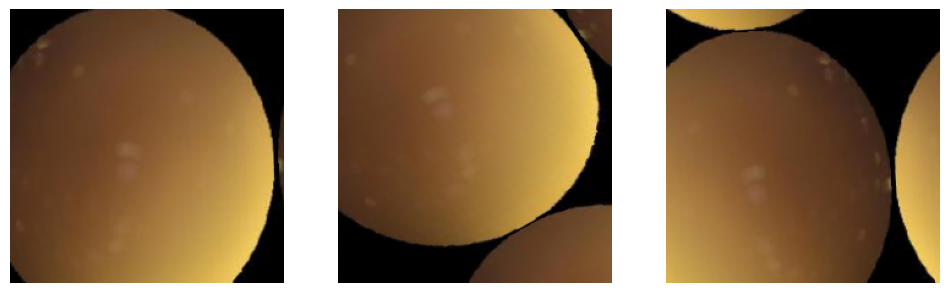

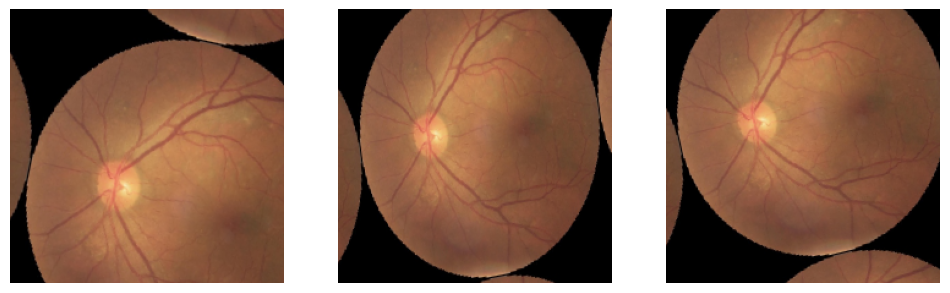

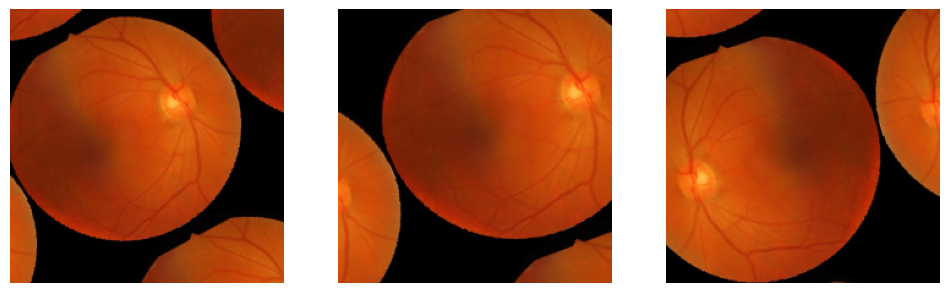

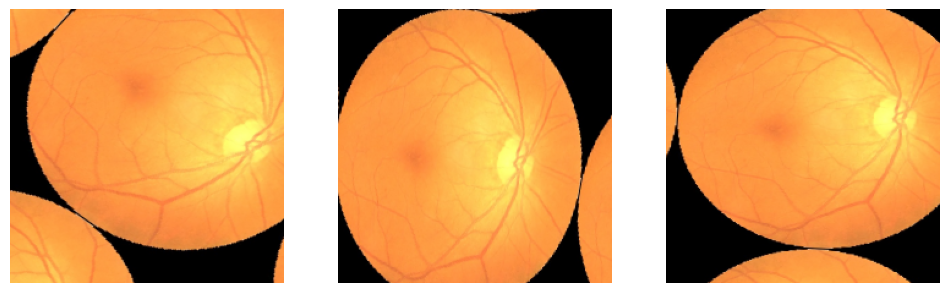

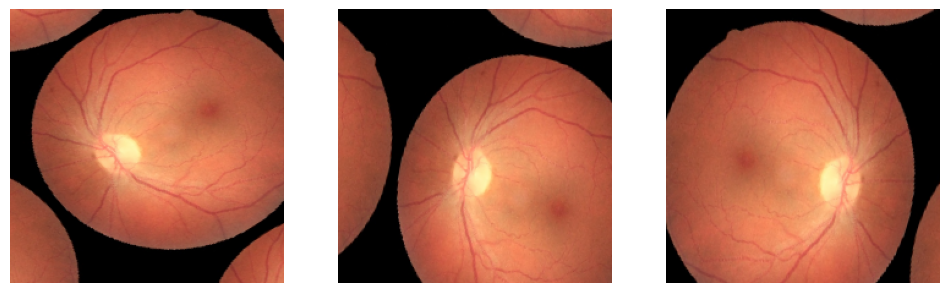

...

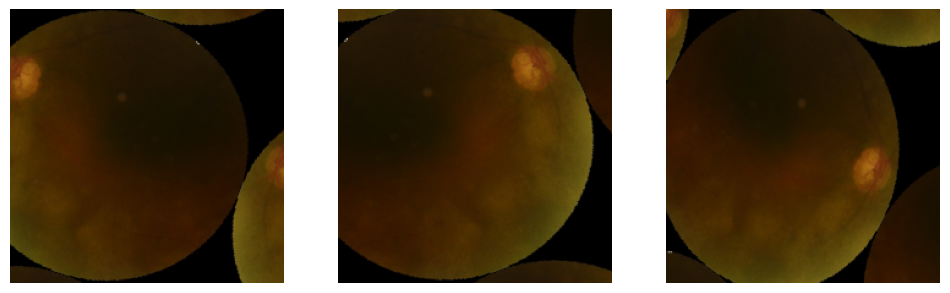

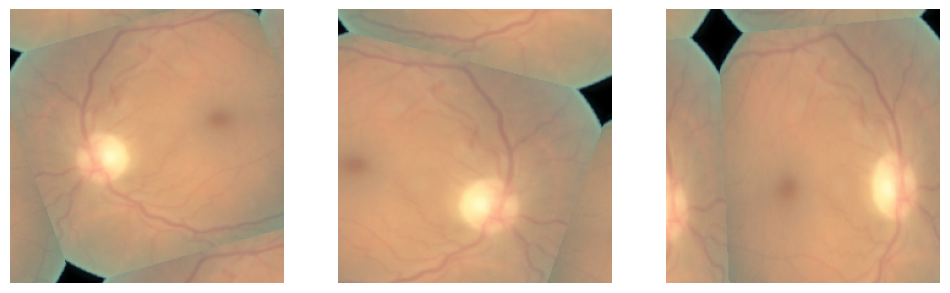

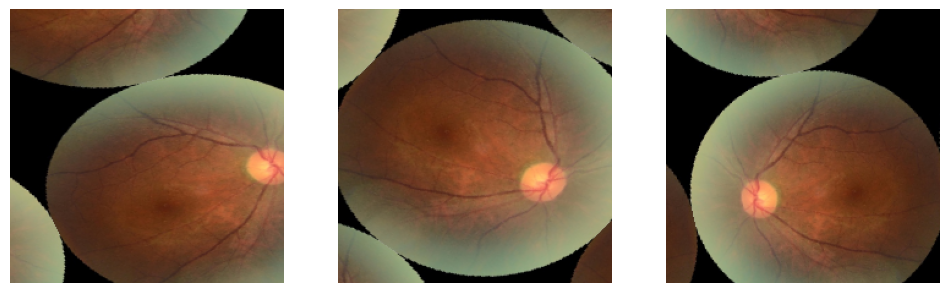

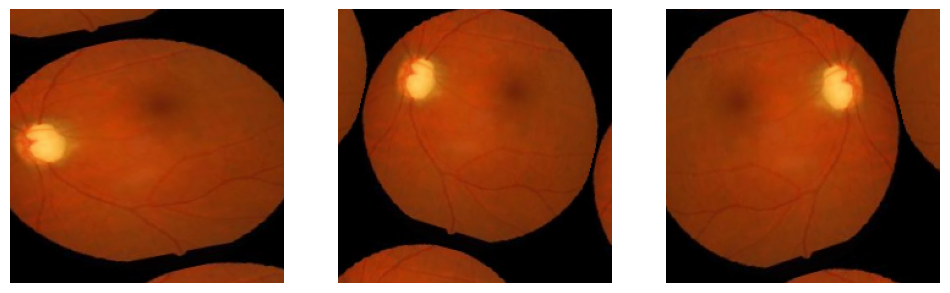

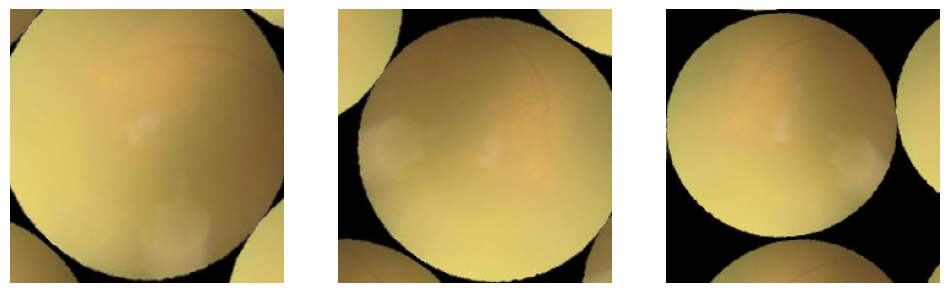

In [ ]:
# prompt: tulis code untuk melakukan data augmentasi pada df gunakan tensorflow library, kemudian tampilkan 15 random image yang telah dilakukan augmentasi

import tensorflow as tf
import matplotlib.pyplot as plt
import random

# Assuming df is already created as in the previous code

# Define the augmentation parameters
IMG_WIDTH = 224
IMG_HEIGHT = 224
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='wrap'
)


# Choose 15 random images from the DataFrame
random_indices = random.sample(range(len(df)), 15)
random_images = df.iloc[random_indices]


# Function to display augmented images
def display_augmented_images(image_path):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array.reshape((1,) + img_array.shape)

    augmented_images = image_generator.flow(img_array, batch_size=1)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    for i in range(3):
        augmented_img = next(augmented_images)[0]
        axes[i].imshow(augmented_img)
        axes[i].axis('off')

    plt.show()

# Display augmented versions of the random images
for index, row in random_images.iterrows():
  display_augmented_images(row['image_path'])


Found 2953 images belonging to 4 classes.


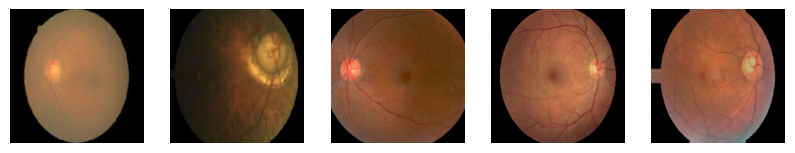

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Define image dimensions and batch size
IMG_WIDTH, IMG_HEIGHT = 224, 224
BATCH_SIZE = 32

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1./255,
    # shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.3  # Split dataset into training and validation sets
)

train_generator = train_datagen.flow_from_directory(
    'eye-disease-dataset/dataset',
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

# Display 5 preprocessed images
plt.figure(figsize=(10, 5))
for i in range(5):
    img, label = next(train_generator)
    plt.subplot(1, 5, i+1)
    plt.imshow(img[0])
    plt.axis('off')
plt.show()


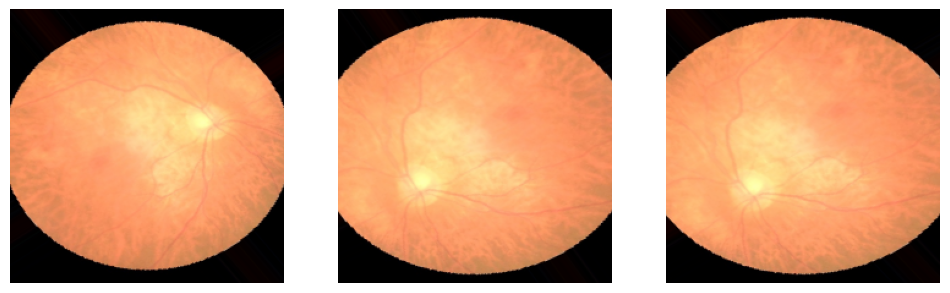

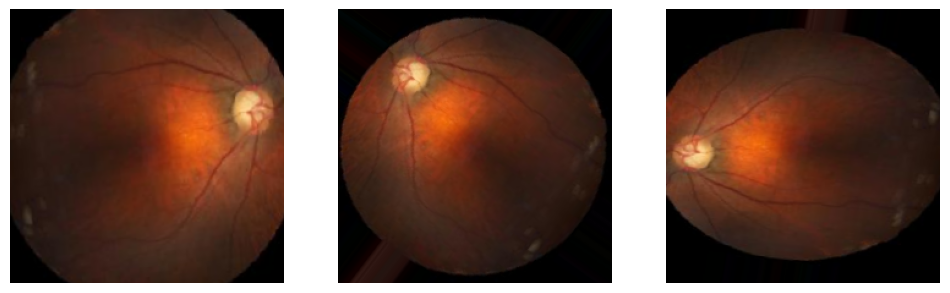

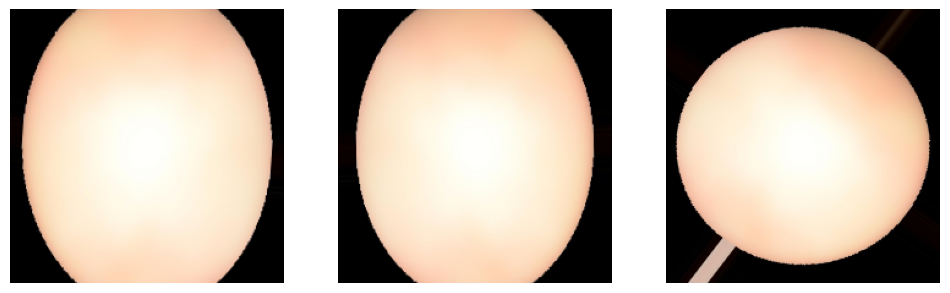

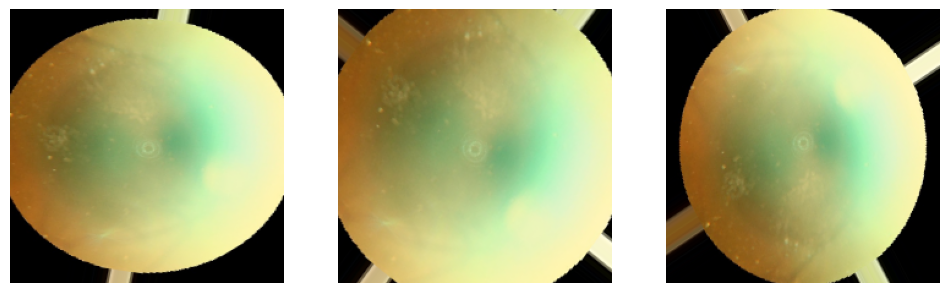

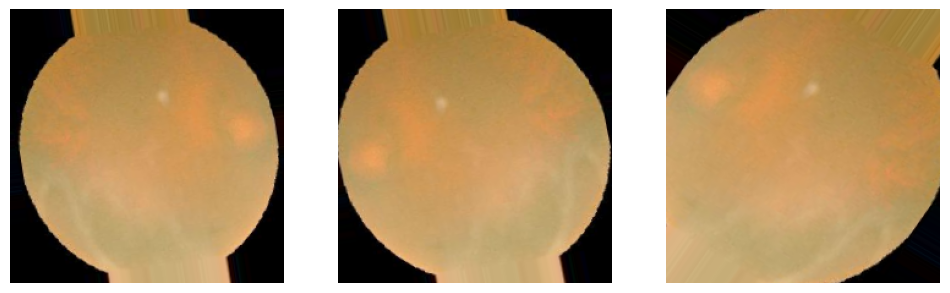

...

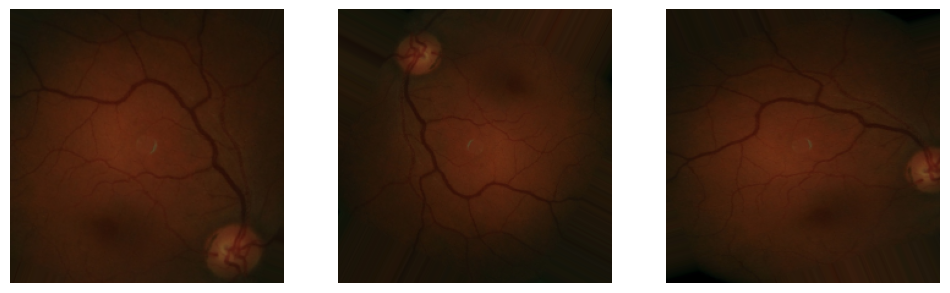

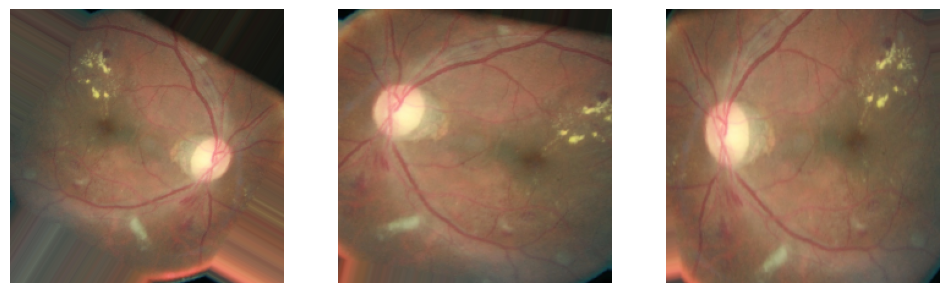

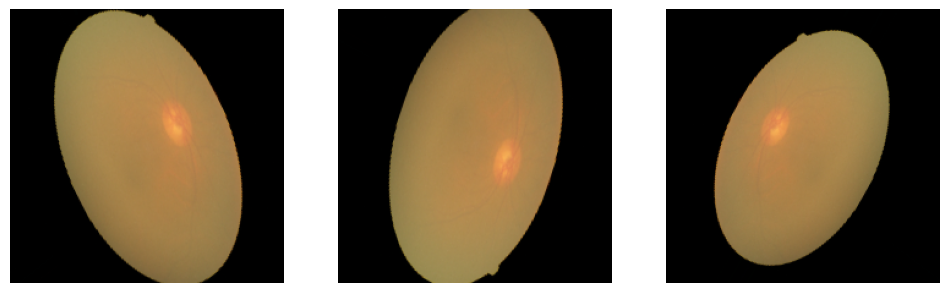

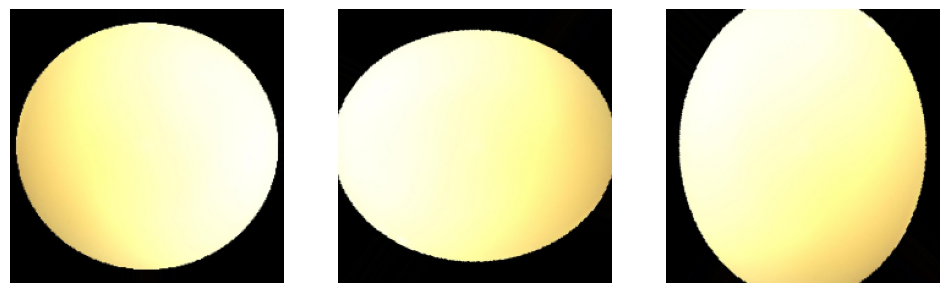

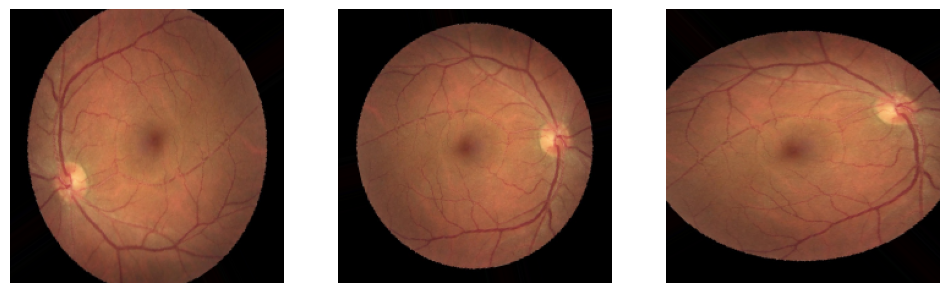

In [ ]:
# prompt: tulis code untuk melakukan data augmentasi pada df gunakan tensorflow library, kemudian tampilkan 15 random image yang telah dilakukan augmentasi

import tensorflow as tf
import matplotlib.pyplot as plt
import random

# Assuming df is already created as in the previous code

# Define the augmentation parameters
IMG_WIDTH = 224
IMG_HEIGHT = 224
image_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.2,
)


# Choose 15 random images from the DataFrame
random_indices = random.sample(range(len(df)), 15)
random_images = df.iloc[random_indices]


# Function to display augmented images
def display_augmented_images(image_path):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = img_array.reshape((1,) + img_array.shape)

    augmented_images = image_generator.flow(img_array, batch_size=1)

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))

    for i in range(3):
        augmented_img = next(augmented_images)[0]
        axes[i].imshow(augmented_img)
        axes[i].axis('off')

    plt.show()

# Display augmented versions of the random images
for index, row in random_images.iterrows():
  display_augmented_images(row['image_path'])


In [ ]:
# prompt: save dataframe df

# Assuming 'df' is your DataFrame
df.to_csv('df.csv', index=False)


In [ ]:
# prompt: tulis code untuk generate mapping dan save dalam txt format

with open('mapping.txt', 'w') as f:
  f.write("normal 0\n")
  f.write("glaucoma 1\n")
  f.write("cataract 2\n")
  f.write("diabetic_retinopathy 3\n")


Found 11807 validated image filenames belonging to 4 classes.
Found 5061 validated image filenames belonging to 4 classes.
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


369/369 ━━━━━━━━━━━━━━━━━━━━ 58s 132ms/step - accuracy: 0.2635 - loss: 1.4566 - val_accuracy: 0.2794 - val_loss: 1.3669 - learning_rate: 0.0010
Epoch 2/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.2676 - loss: 1.3908 - val_accuracy: 0.3766 - val_loss: 1.3639 - learning_rate: 0.0010
Epoch 3/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - accuracy: 0.2918 - loss: 1.3780 - val_accuracy: 0.3130 - val_loss: 1.3599 - learning_rate: 0.0010
Epoch 4/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.2962 - loss: 1.3700 - val_accuracy: 0.3292 - val_loss: 1.3529 - learning_rate: 0.0010
Epoch 5/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.3123 - loss: 1.3649 - val_accuracy: 0.3681 - val_loss: 1.3491 - learning_rate: 0.0010
Epoch 6/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.3179 - loss: 1.3607 - val_accuracy: 0.3659 - val_loss: 1.3466 - learning_rate: 0.0010
Epoch 7/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 37s 99ms/step - accuracy: 0.3225 - l

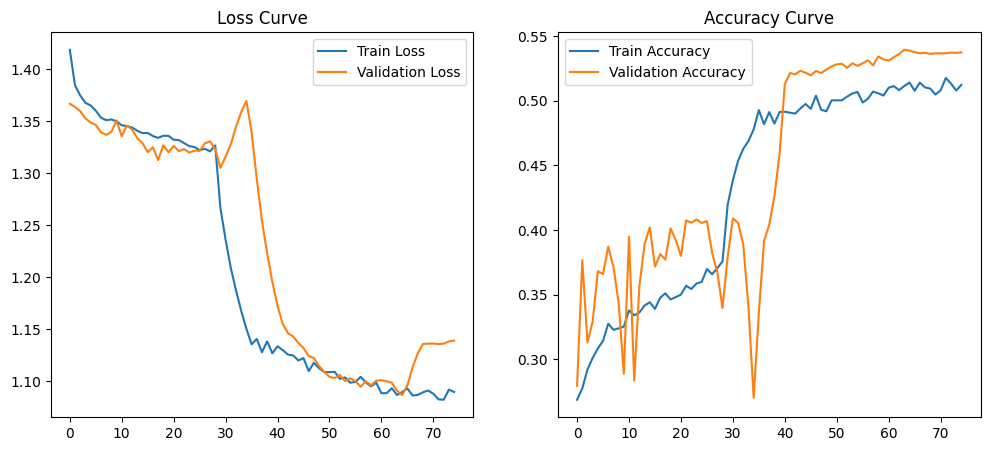

159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step


InvalidParameterError: The 'y_true' parameter of roc_curve must be an array-like. Got False instead.

<Figure size 800x600 with 0 Axes>

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import roc_curve, auc

# Create dataset list
data = []
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Augmented image storage path
augmented_path = "eye-disease-dataset/augmented"
os.makedirs(augmented_path, exist_ok=True)

# Data augmentation generator
augmentor = ImageDataGenerator(rotation_range=20, zoom_range=0.2, horizontal_flip=True,vertical_flip=True)

# Iterate through original images and augment them
for label in mapping:
    folder_path = os.path.join('eye-disease-dataset/dataset', label)
    save_folder = os.path.join(augmented_path, label)
    os.makedirs(save_folder, exist_ok=True)

    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        data.append([image_path, mapping[label]])  # Original image

        # Load and preprocess image
        image = cv2.imread(image_path)
        image = cv2.resize(image, (224, 224))
        image = np.expand_dims(image, axis=0) / 255.0  # Normalize

        # Generate augmented images
        aug_iter = augmentor.flow(image, batch_size=1)
        for i in range(3):  # Save 3 augmented versions per image
            aug_image = next(aug_iter)[0] * 255.0
            aug_filename = f"aug_{i}_{filename}"
            aug_filepath = os.path.join(save_folder, aug_filename)
            cv2.imwrite(aug_filepath, aug_image.astype(np.uint8))
            data.append([aug_filepath, mapping[label]])  # Augmented image

# Create DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])
df['label'] = df['label'].astype(int)

# Split dataset (augmentation only affects training)
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42, shuffle=True)

# Convert labels to strings for compatibility
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)

# Data augmentation for training only
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

# Data generators
train_generator = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='label',
                                                    target_size=(224, 224), class_mode='categorical',
                                                    batch_size=32, shuffle=True)
val_generator = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='label',
                                                target_size=(224, 224), class_mode='categorical',
                                                batch_size=32, shuffle=False)

# Load MobileNetV3 Large as feature extractor
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze base model initially

# Add new classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)  # Prevent overfitting
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(4, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=outputs)

# Compile model
optimizer = SGD(learning_rate=0.001, momentum=0.9, nesterov=True)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train model
history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Fine-tuning: Unfreeze last 30 layers
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile model with lower learning rate
optimizer_finetune = SGD(learning_rate=0.0001, momentum=0.9, nesterov=True)
model.compile(optimizer=optimizer_finetune, loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training with fine-tuning
fine_tune_history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Plot loss and accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'] + fine_tune_history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'] + fine_tune_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'] + fine_tune_history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'] + fine_tune_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

# Compute ROC Curve
val_labels = val_generator.classes
val_preds = model.predict(val_generator)
val_preds_one_hot = np.eye(len(mapping))[np.argmax(val_preds, axis=1)]

plt.figure(figsize=(8, 6))
for i in range(len(mapping)):
    fpr, tpr, _ = roc_curve(val_labels == i, val_preds_one_hot[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# save
tf.saved_model.save(model, "mobilenetv3_saved_model")

# Convert to TFLite directly from SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("mobilenetv3_saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Enable quantization for smaller model size and faster inference

# Convert and save the TFLite model
tflite_model = converter.convert()
with open("mobilenetv3_model.tflite", "wb") as f:
    f.write(tflite_model)


Found 11807 validated image filenames belonging to 4 classes.
Found 5061 validated image filenames belonging to 4 classes.
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


369/369 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - accuracy: 0.2671 - loss: 1.4476 - val_accuracy: 0.2462 - val_loss: 1.3705 - learning_rate: 0.0010
Epoch 2/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.2906 - loss: 1.3802 - val_accuracy: 0.3100 - val_loss: 1.3603 - learning_rate: 0.0010
Epoch 3/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - accuracy: 0.2977 - loss: 1.3738 - val_accuracy: 0.3946 - val_loss: 1.3516 - learning_rate: 0.0010
Epoch 4/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.3049 - loss: 1.3713 - val_accuracy: 0.3078 - val_loss: 1.3552 - learning_rate: 0.0010
Epoch 5/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 37s 101ms/step - accuracy: 0.3113 - loss: 1.3645 - val_accuracy: 0.3632 - val_loss: 1.3443 - learning_rate: 0.0010
Epoch 6/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - accuracy: 0.3127 - loss: 1.3627 - val_accuracy: 0.4100 - val_loss: 1.3449 - learning_rate: 0.0010
Epoch 7/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.3236 -

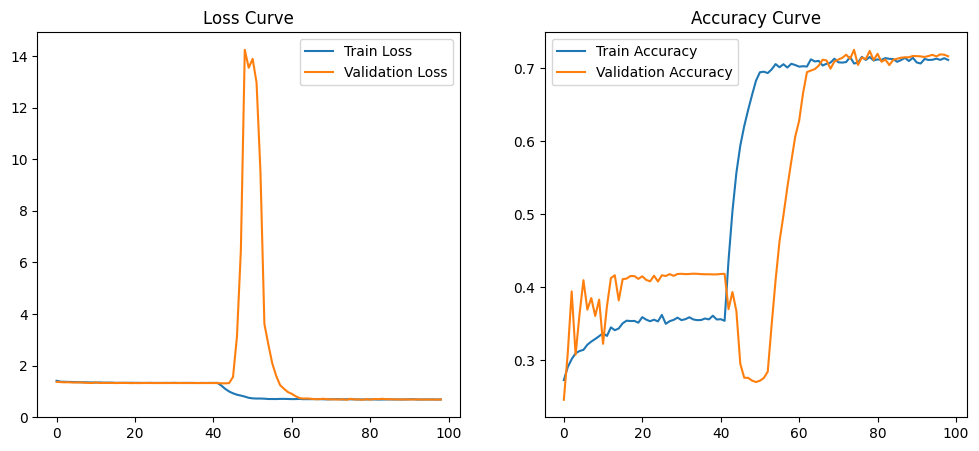

159/159 ━━━━━━━━━━━━━━━━━━━━ 20s 99ms/step


InvalidParameterError: The 'y_true' parameter of roc_curve must be an array-like. Got False instead.

<Figure size 800x600 with 0 Axes>

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import roc_curve, auc

# Create dataset list
data = []
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Augmented image storage path
augmented_path = "eye-disease-dataset/augmented"
os.makedirs(augmented_path, exist_ok=True)

# Data augmentation generator
augmentor = ImageDataGenerator(rotation_range=20, zoom_range=0.2, horizontal_flip=True,vertical_flip=True)

# Iterate through original images and augment them
for label in mapping:
    folder_path = os.path.join('eye-disease-dataset/dataset', label)
    save_folder = os.path.join(augmented_path, label)
    os.makedirs(save_folder, exist_ok=True)

    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        data.append([image_path, mapping[label]])  # Original image

        # Load and preprocess image
        image = cv2.imread(image_path)
        image = cv2.resize(image, (224, 224))
        image = np.expand_dims(image, axis=0) / 255.0  # Normalize

        # Generate augmented images
        aug_iter = augmentor.flow(image, batch_size=1)
        for i in range(3):  # Save 3 augmented versions per image
            aug_image = next(aug_iter)[0] * 255.0
            aug_filename = f"aug_{i}_{filename}"
            aug_filepath = os.path.join(save_folder, aug_filename)
            cv2.imwrite(aug_filepath, aug_image.astype(np.uint8))
            data.append([aug_filepath, mapping[label]])  # Augmented image

# Create DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])
df['label'] = df['label'].astype(int)

# Split dataset (augmentation only affects training)
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42, shuffle=True)

# Convert labels to strings for compatibility
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)

# Data augmentation for training only
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

# Data generators
train_generator = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='label',
                                                    target_size=(224, 224), class_mode='categorical',
                                                    batch_size=32, shuffle=True)
val_generator = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='label',
                                                target_size=(224, 224), class_mode='categorical',
                                                batch_size=32, shuffle=False)

# Load MobileNetV3 Large as feature extractor
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze base model initially

# Add new classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)  # Prevent overfitting
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(4, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=outputs)

# Compile model
optimizer = SGD(learning_rate=0.001, momentum=0.9, nesterov=True)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train model
history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Fine-tuning: Unfreeze last 30 layers
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile model with lower learning rate
optimizer_finetune = SGD(learning_rate=0.001, momentum=0.9, nesterov=True)
model.compile(optimizer=optimizer_finetune, loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training with fine-tuning
fine_tune_history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Plot loss and accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'] + fine_tune_history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'] + fine_tune_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'] + fine_tune_history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'] + fine_tune_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

# Compute ROC Curve
val_labels = val_generator.classes
val_preds = model.predict(val_generator)
val_preds_one_hot = np.eye(len(mapping))[np.argmax(val_preds, axis=1)]

plt.figure(figsize=(8, 6))
for i in range(len(mapping)):
    fpr, tpr, _ = roc_curve(val_labels == i, val_preds_one_hot[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# save
tf.saved_model.save(model, "mobilenetv3_saved_model")

# Convert to TFLite directly from SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("mobilenetv3_saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Enable quantization for smaller model size and faster inference

# Convert and save the TFLite model
tflite_model = converter.convert()
with open("mobilenetv3_model.tflite", "wb") as f:
    f.write(tflite_model)


Found 11807 validated image filenames belonging to 4 classes.
Found 5061 validated image filenames belonging to 4 classes.
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


369/369 ━━━━━━━━━━━━━━━━━━━━ 59s 133ms/step - accuracy: 0.2820 - loss: 1.4317 - val_accuracy: 0.3910 - val_loss: 1.3103 - learning_rate: 0.0010
Epoch 2/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.3479 - loss: 1.3351 - val_accuracy: 0.4128 - val_loss: 1.2848 - learning_rate: 0.0010
Epoch 3/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.3761 - loss: 1.3174 - val_accuracy: 0.4230 - val_loss: 1.2833 - learning_rate: 0.0010
Epoch 4/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 40s 107ms/step - accuracy: 0.3833 - loss: 1.2978 - val_accuracy: 0.4381 - val_loss: 1.2659 - learning_rate: 0.0010
Epoch 5/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - accuracy: 0.3901 - loss: 1.2937 - val_accuracy: 0.3401 - val_loss: 1.2945 - learning_rate: 0.0010
Epoch 6/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.3932 - loss: 1.2899 - val_accuracy: 0.4738 - val_loss: 1.2464 - learning_rate: 0.0010
Epoch 7/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 40s 108ms/step - accuracy: 0.4024 -

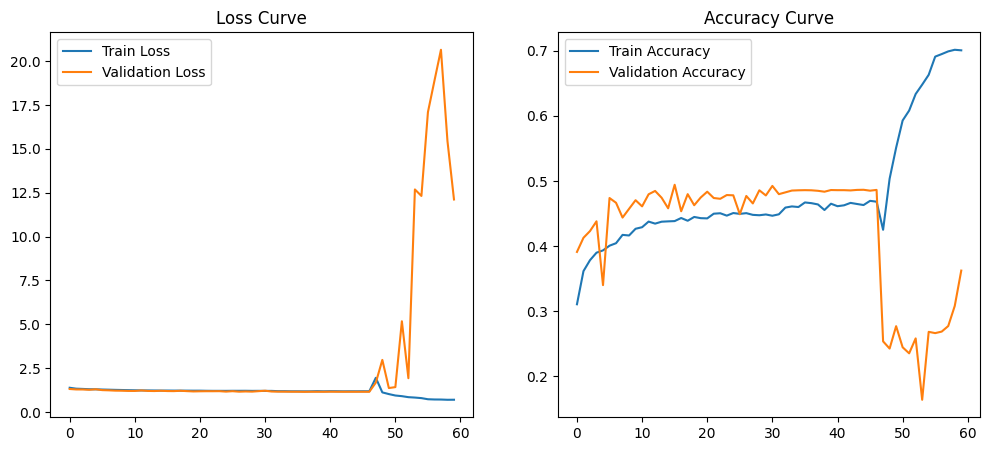

159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step


InvalidParameterError: The 'y_true' parameter of roc_curve must be an array-like. Got False instead.

<Figure size 800x600 with 0 Axes>

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.optimizers import RMSprop

# Create dataset list
data = []
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Augmented image storage path
augmented_path = "eye-disease-dataset/augmented"
os.makedirs(augmented_path, exist_ok=True)

# Data augmentation generator
augmentor = ImageDataGenerator(rotation_range=20, zoom_range=0.2, horizontal_flip=True,vertical_flip=True)

# Iterate through original images and augment them
for label in mapping:
    folder_path = os.path.join('eye-disease-dataset/dataset', label)
    save_folder = os.path.join(augmented_path, label)
    os.makedirs(save_folder, exist_ok=True)

    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        data.append([image_path, mapping[label]])  # Original image

        # Load and preprocess image
        image = cv2.imread(image_path)
        image = cv2.resize(image, (224, 224))
        image = np.expand_dims(image, axis=0) / 255.0  # Normalize

        # Generate augmented images
        aug_iter = augmentor.flow(image, batch_size=1)
        for i in range(3):  # Save 3 augmented versions per image
            aug_image = next(aug_iter)[0] * 255.0
            aug_filename = f"aug_{i}_{filename}"
            aug_filepath = os.path.join(save_folder, aug_filename)
            cv2.imwrite(aug_filepath, aug_image.astype(np.uint8))
            data.append([aug_filepath, mapping[label]])  # Augmented image

# Create DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])
df['label'] = df['label'].astype(int)

# Split dataset (augmentation only affects training)
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42, shuffle=True)

# Convert labels to strings for compatibility
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)

# Data augmentation for training only
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

# Data generators
train_generator = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='label',
                                                    target_size=(224, 224), class_mode='categorical',
                                                    batch_size=32, shuffle=True)
val_generator = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='label',
                                                target_size=(224, 224), class_mode='categorical',
                                                batch_size=32, shuffle=False)

# Load MobileNetV3 Large as feature extractor
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze base model initially

# Add new classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)  # Prevent overfitting
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(4, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=outputs)

# Compile model with RMSprop optimizer
optimizer = RMSprop(learning_rate=0.001, rho=0.9)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train model
history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Fine-tuning: Unfreeze last 30 layers
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile model with lower learning rate for fine-tuning
optimizer_finetune = RMSprop(learning_rate=0.0001, rho=0.9)
model.compile(optimizer=optimizer_finetune, loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training with fine-tuning
fine_tune_history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Plot loss and accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
train_loss = history.history['loss'] + fine_tune_history.history['loss']
val_loss = history.history['val_loss'] + fine_tune_history.history['val_loss']
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
#plt.plot(history.history['loss'] + fine_tune_history.history['loss'], label='Train Loss')
#plt.plot(history.history['val_loss'] + fine_tune_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'] + fine_tune_history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'] + fine_tune_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

# Compute ROC Curve
val_labels = val_generator.classes
val_preds = model.predict(val_generator)
val_preds_one_hot = np.eye(len(mapping))[np.argmax(val_preds, axis=1)]

plt.figure(figsize=(8, 6))
for i in range(len(mapping)):
    fpr, tpr, _ = roc_curve(val_labels == i, val_preds_one_hot[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# save
tf.saved_model.save(model, "mobilenetv3_saved_model")

# Convert to TFLite directly from SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("mobilenetv3_saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Enable quantization for smaller model size and faster inference

# Convert and save the TFLite model
tflite_model = converter.convert()
with open("mobilenetv3_modelRMS.tflite", "wb") as f:
    f.write(tflite_model)


Found 11807 validated image filenames belonging to 4 classes.
Found 5061 validated image filenames belonging to 4 classes.
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


369/369 ━━━━━━━━━━━━━━━━━━━━ 59s 132ms/step - accuracy: 0.2830 - loss: 1.4628 - val_accuracy: 0.3774 - val_loss: 1.3383 - learning_rate: 0.0010
Epoch 2/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 102ms/step - accuracy: 0.3257 - loss: 1.3632 - val_accuracy: 0.4234 - val_loss: 1.3204 - learning_rate: 0.0010
Epoch 3/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - accuracy: 0.3377 - loss: 1.3503 - val_accuracy: 0.3936 - val_loss: 1.3096 - learning_rate: 0.0010
Epoch 4/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 104ms/step - accuracy: 0.3223 - loss: 1.3635 - val_accuracy: 0.4013 - val_loss: 1.3571 - learning_rate: 0.0010
Epoch 5/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 38s 103ms/step - accuracy: 0.3322 - loss: 1.3806 - val_accuracy: 0.4118 - val_loss: 1.3328 - learning_rate: 0.0010
Epoch 6/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step - accuracy: 0.3465 - loss: 1.3771 - val_accuracy: 0.4209 - val_loss: 1.3208 - learning_rate: 0.0010
Epoch 7/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - accuracy: 0.3345 -

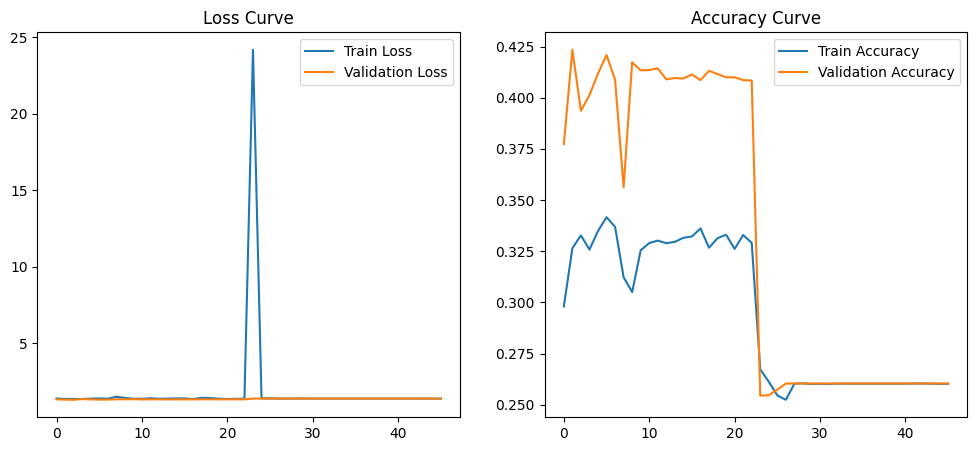

159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step


InvalidParameterError: The 'y_true' parameter of roc_curve must be an array-like. Got False instead.

<Figure size 800x600 with 0 Axes>

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.optimizers import Lion

# Create dataset list
data = []
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Augmented image storage path
augmented_path = "eye-disease-dataset/augmented"
os.makedirs(augmented_path, exist_ok=True)

# Data augmentation generator
augmentor = ImageDataGenerator(rotation_range=20, zoom_range=0.2, horizontal_flip=True,vertical_flip=True)

# Iterate through original images and augment them
for label in mapping:
    folder_path = os.path.join('eye-disease-dataset/dataset', label)
    save_folder = os.path.join(augmented_path, label)
    os.makedirs(save_folder, exist_ok=True)

    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        data.append([image_path, mapping[label]])  # Original image

        # Load and preprocess image
        image = cv2.imread(image_path)
        image = cv2.resize(image, (224, 224))
        image = np.expand_dims(image, axis=0) / 255.0  # Normalize

        # Generate augmented images
        aug_iter = augmentor.flow(image, batch_size=1)
        for i in range(3):  # Save 3 augmented versions per image
            aug_image = next(aug_iter)[0] * 255.0
            aug_filename = f"aug_{i}_{filename}"
            aug_filepath = os.path.join(save_folder, aug_filename)
            cv2.imwrite(aug_filepath, aug_image.astype(np.uint8))
            data.append([aug_filepath, mapping[label]])  # Augmented image

# Create DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])
df['label'] = df['label'].astype(int)

# Split dataset (augmentation only affects training)
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42, shuffle=True)

# Convert labels to strings for compatibility
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)

# Data augmentation for training only
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

# Data generators
train_generator = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='label',
                                                    target_size=(224, 224), class_mode='categorical',
                                                    batch_size=32, shuffle=True)
val_generator = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='label',
                                                target_size=(224, 224), class_mode='categorical',
                                                batch_size=32, shuffle=False)

# Load MobileNetV3 Large as feature extractor
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze base model initially

# Add new classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)  # Prevent overfitting
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(4, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=outputs)

# Compile model
optimizer = Lion(learning_rate=0.001, weight_decay=1e-4)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train model with initial settings
history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Fine-tuning: Unfreeze last 30 layers
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile model with lower learning rate for fine-tuning using Lion
optimizer_finetune = Lion(learning_rate=0.0001, weight_decay=1e-4)
model.compile(optimizer=optimizer_finetune, loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training with fine-tuning
fine_tune_history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Plot loss and accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'] + fine_tune_history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'] + fine_tune_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'] + fine_tune_history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'] + fine_tune_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

# Compute ROC Curve
val_labels = val_generator.classes
val_preds = model.predict(val_generator)
val_preds_one_hot = np.eye(len(mapping))[np.argmax(val_preds, axis=1)]

plt.figure(figsize=(8, 6))
for i in range(len(mapping)):
    fpr, tpr, _ = roc_curve(val_labels == i, val_preds_one_hot[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# save
tf.saved_model.save(model, "mobilenetv3_saved_model")

# Convert to TFLite directly from SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("mobilenetv3_saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Enable quantization for smaller model size and faster inference

# Convert and save the TFLite model
tflite_model = converter.convert()
with open("mobilenetv3_model.tflite", "wb") as f:
    f.write(tflite_model)


Found 11807 validated image filenames belonging to 4 classes.
Found 5061 validated image filenames belonging to 4 classes.
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


369/369 ━━━━━━━━━━━━━━━━━━━━ 69s 141ms/step - accuracy: 0.4133 - loss: 1.2640 - val_accuracy: 0.2535 - val_loss: 1.4252 - learning_rate: 1.0000e-04
Epoch 2/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - accuracy: 0.5361 - loss: 1.0389 - val_accuracy: 0.2618 - val_loss: 1.4311 - learning_rate: 1.0000e-04
Epoch 3/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 39s 106ms/step - accuracy: 0.6041 - loss: 0.9127 - val_accuracy: 0.2500 - val_loss: 1.4577 - learning_rate: 1.0000e-04
Epoch 4/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 39s 104ms/step - accuracy: 0.6382 - loss: 0.8398 - val_accuracy: 0.2456 - val_loss: 1.5203 - learning_rate: 1.0000e-04
Epoch 5/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 39s 105ms/step - accuracy: 0.6607 - loss: 0.8037 - val_accuracy: 0.2452 - val_loss: 1.6343 - learning_rate: 1.0000e-04
Epoch 6/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - accuracy: 0.6758 - loss: 0.7513 - val_accuracy: 0.3041 - val_loss: 1.5427 - learning_rate: 1.0000e-04
Epoch 7/100
369/369 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/s

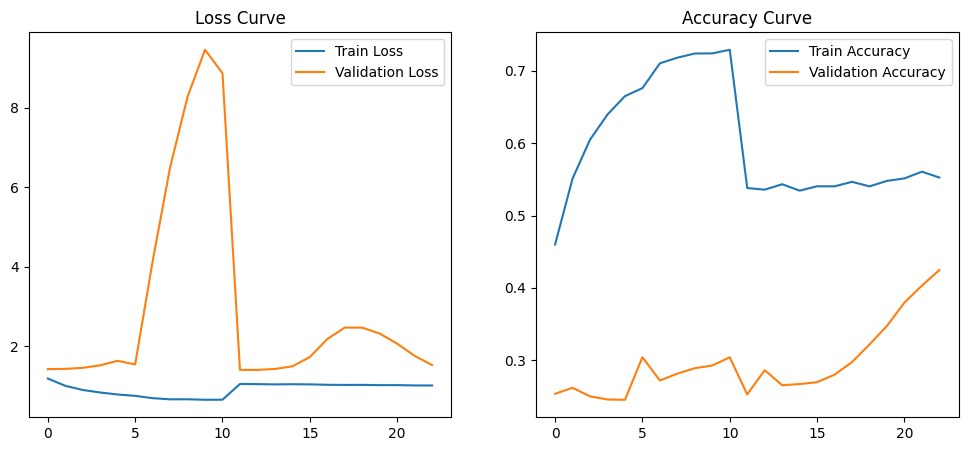

159/159 ━━━━━━━━━━━━━━━━━━━━ 19s 95ms/step


InvalidParameterError: The 'y_true' parameter of roc_curve must be an array-like. Got False instead.

<Figure size 800x600 with 0 Axes>

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.optimizers import AdamW

# Create dataset list
data = []
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Augmented image storage path
augmented_path = "eye-disease-dataset/augmented"
os.makedirs(augmented_path, exist_ok=True)

# Data augmentation generator
augmentor = ImageDataGenerator(rotation_range=20, zoom_range=0.2, horizontal_flip=True,vertical_flip=True)

# Iterate through original images and augment them
for label in mapping:
    folder_path = os.path.join('eye-disease-dataset/dataset', label)
    save_folder = os.path.join(augmented_path, label)
    os.makedirs(save_folder, exist_ok=True)

    for filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, filename)
        data.append([image_path, mapping[label]])  # Original image

        # Load and preprocess image
        image = cv2.imread(image_path)
        image = cv2.resize(image, (224, 224))
        image = np.expand_dims(image, axis=0) / 255.0  # Normalize

        # Generate augmented images
        aug_iter = augmentor.flow(image, batch_size=1)
        for i in range(3):  # Save 3 augmented versions per image
            aug_image = next(aug_iter)[0] * 255.0
            aug_filename = f"aug_{i}_{filename}"
            aug_filepath = os.path.join(save_folder, aug_filename)
            cv2.imwrite(aug_filepath, aug_image.astype(np.uint8))
            data.append([aug_filepath, mapping[label]])  # Augmented image

# Create DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])
df['label'] = df['label'].astype(int)

# Split dataset (augmentation only affects training)
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42, shuffle=True)

# Convert labels to strings for compatibility
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)

# Data augmentation for training only
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

# Data generators
train_generator = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='label',
                                                    target_size=(224, 224), class_mode='categorical',
                                                    batch_size=32, shuffle=True)
val_generator = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='label',
                                                target_size=(224, 224), class_mode='categorical',
                                                batch_size=32, shuffle=False)

# Load MobileNetV3 Large as feature extractor
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze base model initially

# Add new classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)  # Prevent overfitting
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(4, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=outputs)

# Compile model


# Compile model with AdamW optimizer
optimizer = AdamW(learning_rate=0.001, weight_decay=1e-4)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Fine-tuning: Unfreeze last 30 layers
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile model with lower learning rate for fine-tuning
optimizer_finetune = AdamW(learning_rate=0.0001, weight_decay=1e-4)
model.compile(optimizer=optimizer_finetune, loss='categorical_crossentropy', metrics=['accuracy'])


# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train model
history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Fine-tuning: Unfreeze last 30 layers
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Continue training with fine-tuning
fine_tune_history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Plot loss and accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'] + fine_tune_history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'] + fine_tune_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'] + fine_tune_history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'] + fine_tune_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

# Compute ROC Curve
val_labels = val_generator.classes
val_preds = model.predict(val_generator)
val_preds_one_hot = np.eye(len(mapping))[np.argmax(val_preds, axis=1)]

plt.figure(figsize=(8, 6))
for i in range(len(mapping)):
    fpr, tpr, _ = roc_curve(val_labels == i, val_preds_one_hot[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# save
tf.saved_model.save(model, "mobilenetv3_saved_model")

# Convert to TFLite directly from SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("mobilenetv3_saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Enable quantization for smaller model size and faster inference

# Convert and save the TFLite model
tflite_model = converter.convert()
with open("mobilenetv3_model_ada.tflite", "wb") as f:
    f.write(tflite_model)


In [ ]:
# save
import pandas as pd
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split

# ... (Your existing code for data loading, augmentation, and model training) ...

# Save model in TensorFlow SavedModel format (compatible with TFLite)
tf.saved_model.save(model, "mobilenetv3_saved_model")

# Convert to TFLite directly from SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("mobilenetv3_saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Enable quantization for smaller model size and faster inference

# Convert and save the TFLite model
tflite_model = converter.convert()
with open("mobilenetv3_model.tflite", "wb") as f:
    f.write(tflite_model)

# ... (Rest of your code for plotting curves) ...

# trial

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
import os # import os module

# Create an empty list to store the data
data = []

# Define the mapping
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Iterate through the folders and images
for label in mapping:
  folder_path = os.path.join('eye-disease-dataset/dataset', label)
  for filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, filename)
    data.append([image_path, mapping[label]])

# Create a Pandas DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])

# Convert 'label' column to integers
df['label'] = df['label'].astype(int)


# Split dataset with shuffle
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42, shuffle=True)

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, zoom_range=0.2, horizontal_flip=True, vertical_flip=True)
val_datagen = ImageDataGenerator()

# Convert 'label' column to strings before creating the data generators
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)

# Data generators
train_generator = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='label',
                                                    target_size=(224, 224), class_mode='categorical',
                                                    batch_size=32, shuffle=True)
val_generator = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='label',
                                                target_size=(224, 224), class_mode='categorical',
                                                batch_size=32, shuffle=False)

# Load MobileNetV3 Large as feature extractor
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False  # Freeze base model initially

# Add new classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)  # Prevent overfitting
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(4, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=outputs)

# Compile model
optimizer = SGD(learning_rate=0.001, momentum=0.9, nesterov=True)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train model
history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Fine-tuning: Unfreeze last 30 layers
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile model with lower learning rate
optimizer_finetune = SGD(learning_rate=0.0001, momentum=0.9, nesterov=True)
model.compile(optimizer=optimizer_finetune, loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training with fine-tuning
fine_tune_history = model.fit(train_generator, epochs=30, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Save model in TensorFlow SavedModel format (compatible with TFLite)
model.save("mobilenetv3_saved_model")

# Convert to TFLite directly from SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("mobilenetv3_saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Enable quantization

# Convert and save
tflite_model = converter.convert()
with open("mobilenetv3_model.tflite", "wb") as f:
    f.write(tflite_model)

# Plot loss and accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'] + fine_tune_history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'] + fine_tune_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'] + fine_tune_history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'] + fine_tune_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

# Compute ROC Curve
val_labels = val_generator.classes
val_preds = model.predict(val_generator)
val_preds_one_hot = np.eye(len(mapping))[np.argmax(val_preds, axis=1)]

plt.figure(figsize=(8, 6))
for i in range(len(mapping)):
    fpr, tpr, _ = roc_curve(val_labels == i, val_preds_one_hot[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


Found 2951 validated image filenames belonging to 4 classes.
Found 1266 validated image filenames belonging to 4 classes.
12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step - accuracy: 0.2570 - loss: 1.4921

KeyboardInterrupt: 

Found 2951 validated image filenames belonging to 4 classes.
Found 1266 validated image filenames belonging to 4 classes.
12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 75s 670ms/step - accuracy: 0.2445 - loss: 1.4961 - val_accuracy: 0.2385 - val_loss: 1.3856
Epoch 2/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 50s 535ms/step - accuracy: 0.2595 - loss: 1.4141 - val_accuracy: 0.2883 - val_loss: 1.3814
Epoch 3/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 49s 526ms/step - accuracy: 0.2617 - loss: 1.4064 - val_accuracy: 0.3081 - val_loss: 1.3790
Epoch 4/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 48s 522ms/step - accuracy: 0.2557 - loss: 1.3974 - val_accuracy: 0.2464 - val_loss: 1.3811
Epoch 5/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 49s 521ms/step - accuracy: 0.2869 - loss: 1.3838 - val_accuracy: 0.2575 - val_loss: 1.3757
Epoch 6/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 48s 519ms/step - accuracy: 0.2855 - loss: 1.3884 - val_accuracy: 0.2464 - val_loss: 1.3769
Epoch 7/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 48s 517ms/step - accuracy: 0.2622 - loss: 1.3911 - val_accuracy: 0.2867 - val_loss: 1.3737
Epoch 8/100
93/93 ━━━━━━━━━━━━━━━━━━━━ 49s 524ms/step - accuracy: 0.2776 - loss: 1.3833 - 

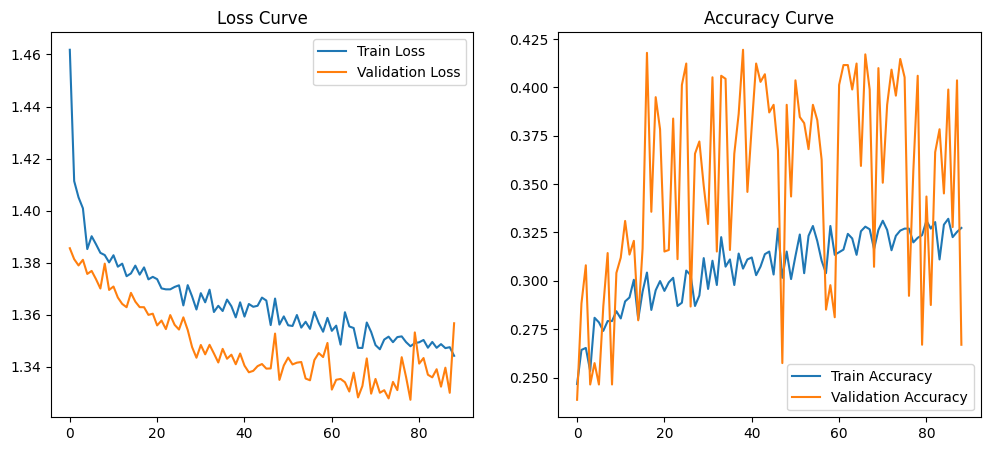

40/40 ━━━━━━━━━━━━━━━━━━━━ 15s 270ms/step


InvalidParameterError: The 'y_true' parameter of roc_curve must be an array-like. Got False instead.

<Figure size 800x600 with 0 Axes>

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_curve, auc
import os # import os module

# Create an empty list to store the data
data = []

# Define the mapping
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Iterate through the folders and images
for label in mapping:
  folder_path = os.path.join('eye-disease-dataset/dataset', label)
  for filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, filename)
    data.append([image_path, mapping[label]])

# Create a Pandas DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])


# Convert 'label' column to integers
df['label'] = df['label'].astype(int)

# Split dataset
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42)

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
                                   horizontal_flip=True, fill_mode='nearest')
val_datagen = ImageDataGenerator(rescale=1./255)

# Convert 'label' column to strings before creating the data generators
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)

# Data generators
train_generator = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='label',
                                                    target_size=(224, 224), class_mode='categorical',
                                                    batch_size=32)
val_generator = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='label',
                                                target_size=(224, 224), class_mode='categorical',
                                                batch_size=32)

# Load MobileNetV3 Large
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

# Add custom layers
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
predictions = Dense(4, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
optimizer = SGD(learning_rate=0.001, momentum=0.9, nesterov=True)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train model
history = model.fit(train_generator, epochs=100, validation_data=val_generator, callbacks=[early_stopping])

# Plot loss and accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

# Compute ROC Curve
val_labels = val_generator.classes
val_preds = model.predict(val_generator)
val_preds_one_hot = np.eye(4)[np.argmax(val_preds, axis=1)]

plt.figure(figsize=(8, 6))
for i in range(len(mapping)):
    fpr, tpr, _ = roc_curve(val_labels == i, val_preds_one_hot[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_curve, auc
import os # import os module
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Load dataset
# df = pd.read_csv('/mnt/data/df.csv')
# mapping = {"normal": 0, "glaucoma": 1, "cataract": 2, "diabetic_retinopathy": 3}
# df['label'] = df['label'].map(mapping)

# Create an empty list to store the data
data = []

# Define the mapping
mapping = {'normal': 0, 'glaucoma': 1, 'cataract': 2, 'diabetic_retinopathy': 3}

# Iterate through the folders and images
for label in mapping:
  folder_path = os.path.join('eye-disease-dataset/dataset', label)
  for filename in os.listdir(folder_path):
    image_path = os.path.join(folder_path, filename)
    data.append([image_path, mapping[label]])

# Create a Pandas DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])

# Convert 'label' column to integers
df['label'] = df['label'].astype(int)


# Split dataset with shuffle
train_df, val_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42, shuffle=True)

# Convert 'label' column to strings *after* splitting the DataFrame
train_df['label'] = train_df['label'].astype(str)  # Change to str here
val_df['label'] = val_df['label'].astype(str)    # Change to str here

# Data augmentation
train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=20, width_shift_range=0.2,
                                   height_shift_range=0.2, shear_range=0.2, zoom_range=0.2,
                                   horizontal_flip=True, fill_mode='nearest')
val_datagen = ImageDataGenerator(rescale=1./255)

# Data generators
train_generator = train_datagen.flow_from_dataframe(train_df, x_col='image_path', y_col='label',
                                                    target_size=(224, 224), class_mode='categorical',
                                                    batch_size=32, shuffle=True)
val_generator = val_datagen.flow_from_dataframe(val_df, x_col='image_path', y_col='label',
                                                target_size=(224, 224), class_mode='categorical',
                                                batch_size=32, shuffle=False)

# Load MobileNetV3 Large (Pretrained, No Modifications)
base_model = MobileNetV3Large(weights='imagenet', include_top=True)
base_model.trainable = False  # Freeze base model initially

# Compile model
optimizer = SGD(learning_rate=0.001, momentum=0.9, nesterov=True)
base_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_reduction = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6)

# Train model
history = base_model.fit(train_generator, epochs=50, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Fine-tuning: Unfreeze last 30 layers
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile model with lower learning rate
optimizer_finetune = SGD(learning_rate=0.0001, momentum=0.9, nesterov=True)
base_model.compile(optimizer=optimizer_finetune, loss='categorical_crossentropy', metrics=['accuracy'])

# Continue training with fine-tuning
fine_tune_history = base_model.fit(train_generator, epochs=50, validation_data=val_generator, callbacks=[early_stopping, lr_reduction])

# Save model in TensorFlow SavedModel format (compatible with TFLite)
base_model.save("mobilenetv3_saved_model")

# Convert to TFLite directly from SavedModel
converter = tf.lite.TFLiteConverter.from_saved_model("mobilenetv3_saved_model")
converter.optimizations = [tf.lite.Optimize.DEFAULT]  # Enable quantization

# Convert and save
tflite_model = converter.convert()
with open("mobilenetv3_model.tflite", "wb") as f:
    f.write(tflite_model)

# Plot loss and accuracy curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'] + fine_tune_history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'] + fine_tune_history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss Curve')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'] + fine_tune_history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'] + fine_tune_history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy Curve')
plt.show()

# Compute ROC Curve
val_labels = val_generator.classes
val_preds = base_model.predict(val_generator)
val_preds_one_hot = np.eye(len(mapping))[np.argmax(val_preds, axis=1)]

plt.figure(figsize=(8, 6))
for i in range(len(mapping)):
    fpr, tpr, _ = roc_curve(val_labels == i, val_preds_one_hot[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()


Found 2951 validated image filenames belonging to 4 classes.
Found 1266 validated image filenames belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/applications/mobilenet_v3.py:517: UserWarning: `input_shape` is undefined or non-square, or `rows` is not 224. Weights for input shape (224, 224) will be loaded as the default.
  return MobileNetV3(
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50


ValueError: Arguments `target` and `output` must have the same shape. Received: target.shape=(None, 4), output.shape=(None, 1000)

In [ ]:
# prompt: gunakan df dariapada langusng dari drectory. kemudian lakukan augmentasi dan build model menggunakan mobilenetv3 large dengan tensorflow library, dimulai transform dan augmentasi image, split dataset 70% raining dan 30% validation, lalu training model dengan jumlah epoch 100 dan menggunakan SDGM Nsterov dengan learning rate 0.001. lakukan early stopping jika model menunjukkan inidkasi overfitting dan tambahkan dropout logic. kemudian visualisasi loss curve, accuracy curve, dan ROC curve. write all of it

import pandas as pd
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split

# Assuming df is already created and contains 'image_path' and 'label' columns

# Data Augmentation and Splitting
IMG_WIDTH, IMG_HEIGHT = 224, 224
BATCH_SIZE = 32

datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.2,
    validation_split=0.3
)

train_df, validation_df = train_test_split(df, test_size=0.3, random_state=42)

train_df['label'] = train_df['label'].astype(str)
validation_df['label'] = validation_df['label'].astype(str)

train_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='image_path',
    y_col='label',
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_dataframe(
    dataframe=validation_df,
    x_col='image_path',
    y_col='label',
    target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation'
)


# Model Building
base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(IMG_WIDTH, IMG_HEIGHT, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)  # Add dropout layer
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(train_generator.class_indices), activation='softmax')(x)  # Assuming 4 classes

model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model
sgd_nesterov = SGD(learning_rate=0.001, nesterov=True)
model.compile(optimizer=sgd_nesterov, loss='categorical_crossentropy', metrics=['accuracy'])

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = model.fit(
    train_generator,
    epochs=100,
    validation_data=validation_generator,
    callbacks=[early_stopping]
)

# Plot Loss Curves
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Curves')
plt.legend()
plt.show()

# Plot Accuracy Curves
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Curves')
plt.legend()
plt.show()


# ROC Curve (Example for one class, adapt for multi-class)
y_pred = model.predict(validation_generator)
y_true = validation_generator.classes


# Assuming binary classification for this example ROC curve
# Adapt the code for multi-class scenarios
fpr, tpr, thresholds = roc_curve(y_true, y_pred[:,1]) #example for class 1
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()


ValueError: With n_samples=0, test_size=0.3 and train_size=None, the resulting train set will be empty. Adjust any of the aforementioned parameters.